In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from factor_analyzer import FactorAnalyzer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn import manifold
from sklearn.metrics import explained_variance_score
import seaborn as sns

In [61]:
df = pd.read_csv('D:/Study matertrial/Masters project/F_dataset.csv')

In [62]:
df.head()

,TXN_type,TXN_ID,User_ID,User_name,method,international/Domestic,issuer,network,bank,transaction pipeline_id,...,tax,on_hold,Disbursed date,settlement_id,description,utr,order_id,payment_status,settlement_status,company_name
0,refund,Dke2kDB8kEyD,VkQFXRWGybl9,ABC Technologies,NaN,Domestic,NaN,Other method,NaN,NBh,...,0.0,0,06-06-2022,NaN,NaN,6.0,NaN,NaN,NaN,sagasIT
1,refund,CTb00uFFryrH,VkQFXRWGybl9,ABC Technologies,NaN,Domestic,NaN,Other method,NaN,NBh,...,0.0,0,07-06-2022,NaN,NaN,6.0,NaN,NaN,NaN,flipkart
2,reversal,DkduupVQDbzl,VkQFXRWGybl9,ABC Technologies,NaN,Domestic,NaN,Other method,NaN,NBh,...,0.0,0,07-06-2022,NaN,NaN,6.0,NaN,NaN,NaN,flipkart
3,refund,Ck4KbmBxgnlM,VkQFXRWGybl9,ABC Technologies,NaN,Domestic,NaN,Other method,NaN,NBh,...,0.0,0,06-06-2022,NaN,NaN,6.0,NaN,NaN,NaN,mindTree
4,reversal,Ck4F4gAhhgpa,VkQFXRWGybl9,ABC Technologies,NaN,Domestic,NaN,Other method,NaN,NBh,...,0.0,0,07-06-2022,NaN,NaN,6.0,NaN,NaN,NaN,zara limited


In [63]:
df.isna().sum()

TXN_type                        0
TXN_ID                          0
User_ID                         0
User_name                       0
method                     492185
international/Domestic          0
issuer                     926724
network                         0
bank                       979864
transaction pipeline_id         0
Pipeline_Category               0
User_category                   0
settled_flag                    0
credit_type                     0
created_date                    0
amount                          0
debit                           0
credit                          0
fee                             0
tax                             0
on_hold                         0
Disbursed date                  0
settlement_id               28053
description                982398
utr                             0
order_id                   492312
payment_status             492185
settlement_status           28053
company_name                    0
dtype: int64

In [64]:
df.drop(['method','issuer','bank','description','order_id','payment_status'],axis=1,inplace=True)

In [65]:
index = np.where(df.settlement_id.isnull())
index1 = np.where(df.settlement_status.isnull())
index[0][-5:], index1[0][-5:]

(array([982387, 982388, 982390, 982392, 982394], dtype=int64),
 array([982387, 982388, 982390, 982392, 982394], dtype=int64))

In [66]:
lst1 = []
for i in index[0]:
    if i not in index1[0]:
        lst1.append(i)
        
lst1

[]

In [67]:
df.drop(index[0], axis = 0, inplace = True)

In [68]:
df.isnull().sum()

TXN_type                   0
TXN_ID                     0
User_ID                    0
User_name                  0
international/Domestic     0
network                    0
transaction pipeline_id    0
Pipeline_Category          0
User_category              0
settled_flag               0
credit_type                0
created_date               0
amount                     0
debit                      0
credit                     0
fee                        0
tax                        0
on_hold                    0
Disbursed date             0
settlement_id              0
utr                        0
settlement_status          0
company_name               0
dtype: int64

In [69]:
df.shape

(954345, 23)

In [70]:
df.drop_duplicates()

,TXN_type,TXN_ID,User_ID,User_name,international/Domestic,network,transaction pipeline_id,Pipeline_Category,User_category,settled_flag,...,debit,credit,fee,tax,on_hold,Disbursed date,settlement_id,utr,settlement_status,company_name
23541,transfer,n3FmNM46J3o4,VkQFXRWGybl9,ABC Technologies,Domestic,Other method,NBh,0,Others,Gateway Settled,...,184.35,0.00,0.55,0.08,0,31-05-2022,hUKiA82zvg,2.210000e+18,processed,sagasIT
23542,transfer,nPPuEpxdTRbP,VkQFXRWGybl9,ABC Technologies,Domestic,Other method,NBh,0,Others,Gateway Settled,...,18.90,0.00,0.05,0.00,0,31-05-2022,hUKiA82zvg,2.210000e+18,processed,sagasIT
23543,transfer,n6nNxpFEYN3U,VkQFXRWGybl9,ABC Technologies,Domestic,Other method,NBh,0,Others,Gateway Settled,...,18.90,0.00,0.05,0.00,0,31-05-2022,hUKiA82zvg,2.210000e+18,processed,myntra
23544,transfer,nNDGZ5hoDK8O,VkQFXRWGybl9,ABC Technologies,Domestic,Other method,NBh,0,Others,Gateway Settled,...,18.90,0.00,0.05,0.00,0,31-05-2022,hUKiA82zvg,2.210000e+18,processed,myntra
23545,transfer,n56yTMhRZwy3,VkQFXRWGybl9,ABC Technologies,Domestic,Other method,NBh,0,Others,Gateway Settled,...,13.50,0.00,0.04,0.00,0,31-05-2022,hUKiA82zvg,2.210000e+18,processed,sagasIT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
982391,payment,ujYDsAM2m5Xd,VkQFXRWGybl9,ABC Technologies,Domestic,Other method,hwf4XBOMnsNBh,1234,Others,Gateway Settled,...,0.00,1951.82,47.18,7.20,0,17-12-2021,StKqbjbcKn,6.090000e+11,processed,mindTree
982393,payment,Exp2RwcOuFet,VkQFXRWGybl9,ABC Technologies,Domestic,Visa,RgWC4WkhdDNBh,5817,Others,Gateway Settled,...,0.00,1959.02,39.98,0.00,0,13-12-2021,CKdApDLhVO,5.550000e+11,processed,myntra
982395,payment,W0fdLs1kleZe,VkQFXRWGybl9,ABC Technologies,Domestic,Other method,hwf4XBOMnsNBh,1234,Others,Gateway Settled,...,0.00,4881.02,117.98,18.00,0,11-12-2021,lFqpuJKbXn,5.160000e+11,processed,myntra
982396,payment,hI6SRmlcFjqn,VkQFXRWGybl9,ABC Technologies,Domestic,Other method,MmzbL6FPe4NBh,0,Others,Gateway Settled,...,0.00,1951.82,47.18,7.20,0,11-12-2021,lFqpuJKbXn,5.160000e+11,processed,sagasIT


In [71]:
df.drop(['TXN_ID','User_ID','User_name','international/Domestic','settled_flag','settlement_id','settlement_status','on_hold'], axis=1, inplace= True)

In [72]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 954345 entries, 23541 to 982397
Data columns (total 15 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   TXN_type                 954345 non-null  object 
 1   network                  954345 non-null  object 
 2   transaction pipeline_id  954345 non-null  object 
 3   Pipeline_Category        954345 non-null  int64  
 4   User_category            954345 non-null  object 
 5   credit_type              954345 non-null  object 
 6   created_date             954345 non-null  object 
 7   amount                   954345 non-null  float64
 8   debit                    954345 non-null  float64
 9   credit                   954345 non-null  float64
 10  fee                      954345 non-null  float64
 11  tax                      954345 non-null  float64
 12  Disbursed date           954345 non-null  object 
 13  utr                      954345 non-null  float64
 14  

In [73]:
np.set_printoptions(threshold = np.inf)

le = LabelEncoder()
df['TXN_type'] = le.fit_transform(df['TXN_type'])
df['network'] = le.fit_transform(df['network'])
df['transaction pipeline_id'] = le.fit_transform(df['transaction pipeline_id'])
df['User_category'] = le.fit_transform(df['User_category'])
df['credit_type'] = le.fit_transform(df['credit_type'])
df['company_name'] = le.fit_transform(df['company_name'])

df

,TXN_type,network,transaction pipeline_id,Pipeline_Category,User_category,credit_type,created_date,amount,debit,credit,fee,tax,Disbursed date,utr,company_name
23541,5,1,19,0,0,2,31-05-2022,184.35,184.35,0.00,0.55,0.08,31-05-2022,2.210000e+18,3
23542,5,1,19,0,0,2,31-05-2022,18.90,18.90,0.00,0.05,0.00,31-05-2022,2.210000e+18,3
23543,5,1,19,0,0,2,31-05-2022,18.90,18.90,0.00,0.05,0.00,31-05-2022,2.210000e+18,2
23544,5,1,19,0,0,2,31-05-2022,18.90,18.90,0.00,0.05,0.00,31-05-2022,2.210000e+18,2
23545,5,1,19,0,0,2,31-05-2022,13.50,13.50,0.00,0.04,0.00,31-05-2022,2.210000e+18,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
982391,1,1,47,1234,0,1,13-12-2021,1999.00,0.00,1951.82,47.18,7.20,17-12-2021,6.090000e+11,1
982393,1,3,30,5817,0,1,11-12-2021,1999.00,0.00,1959.02,39.98,0.00,13-12-2021,5.550000e+11,2
982395,1,1,47,1234,0,1,09-12-2021,4999.00,0.00,4881.02,117.98,18.00,11-12-2021,5.160000e+11,2
982396,1,1,18,0,0,1,07-12-2021,1999.00,0.00,1951.82,47.18,7.20,11-12-2021,5.160000e+11,3


In [74]:
df.drop(df[['created_date','Disbursed date']], axis=1, inplace=True)

In [75]:
df

,TXN_type,network,transaction pipeline_id,Pipeline_Category,User_category,credit_type,amount,debit,credit,fee,tax,utr,company_name
23541,5,1,19,0,0,2,184.35,184.35,0.00,0.55,0.08,2.210000e+18,3
23542,5,1,19,0,0,2,18.90,18.90,0.00,0.05,0.00,2.210000e+18,3
23543,5,1,19,0,0,2,18.90,18.90,0.00,0.05,0.00,2.210000e+18,2
23544,5,1,19,0,0,2,18.90,18.90,0.00,0.05,0.00,2.210000e+18,2
23545,5,1,19,0,0,2,13.50,13.50,0.00,0.04,0.00,2.210000e+18,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
982391,1,1,47,1234,0,1,1999.00,0.00,1951.82,47.18,7.20,6.090000e+11,1
982393,1,3,30,5817,0,1,1999.00,0.00,1959.02,39.98,0.00,5.550000e+11,2
982395,1,1,47,1234,0,1,4999.00,0.00,4881.02,117.98,18.00,5.160000e+11,2
982396,1,1,18,0,0,1,1999.00,0.00,1951.82,47.18,7.20,5.160000e+11,3


In [76]:
scaler = StandardScaler()

In [77]:
for col in df:
    scaler = StandardScaler()
    df[col] = scaler.fit_transform(df[[col]])

In [78]:
df.head()

,TXN_type,network,transaction pipeline_id,Pipeline_Category,User_category,credit_type,amount,debit,credit,fee,tax,utr,company_name
23541,0.998481,-0.157113,-0.746289,-0.364748,-0.049083,6.523827,-0.269370,-0.082506,-0.300021,-0.270841,-0.249493,0.453827,0.708126
23542,0.998481,-0.157113,-0.746289,-0.364748,-0.049083,6.523827,-0.380706,-0.224603,-0.300021,-0.296960,-0.276974,0.453827,0.708126
23543,0.998481,-0.157113,-0.746289,-0.364748,-0.049083,6.523827,-0.380706,-0.224603,-0.300021,-0.296960,-0.276974,0.453827,0.001116
23544,0.998481,-0.157113,-0.746289,-0.364748,-0.049083,6.523827,-0.380706,-0.224603,-0.300021,-0.296960,-0.276974,0.453827,0.001116
23545,0.998481,-0.157113,-0.746289,-0.364748,-0.049083,6.523827,-0.384340,-0.229240,-0.300021,-0.297482,-0.276974,0.453827,0.708126


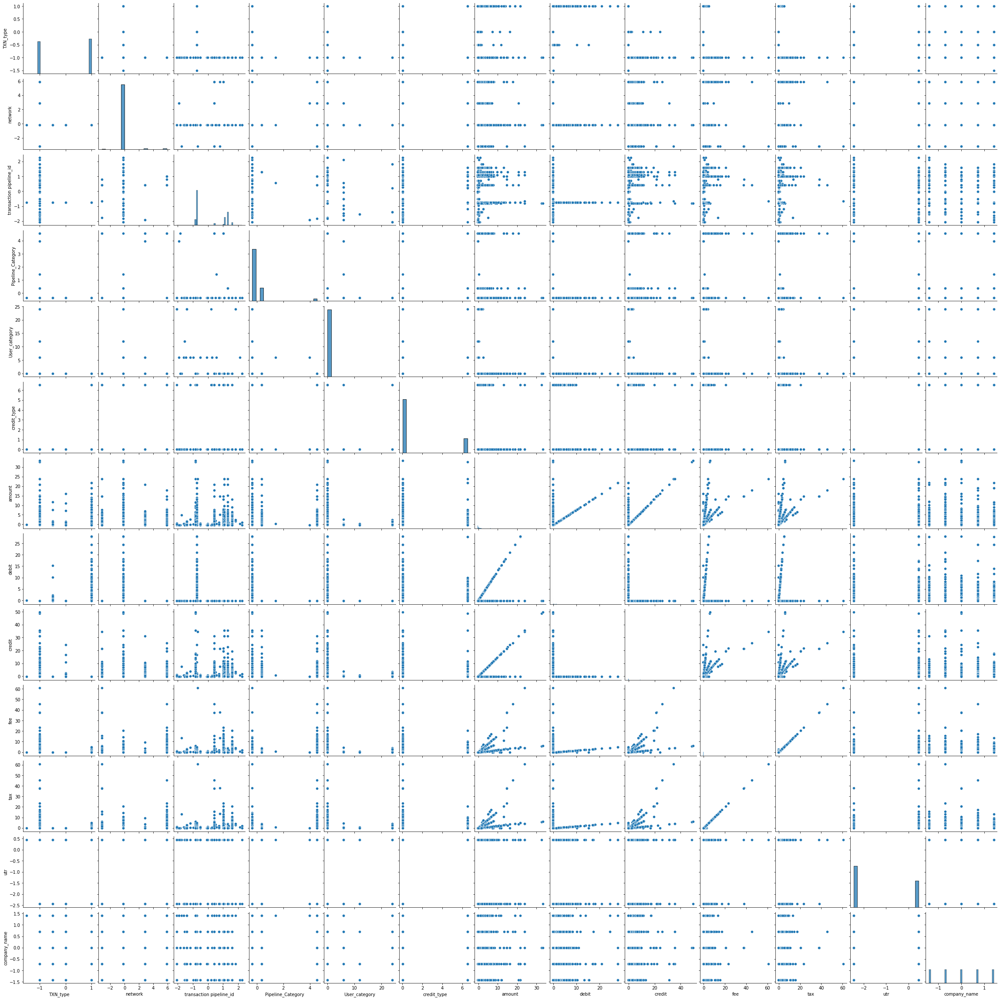

In [99]:
sns.pairplot(df[:50000])

In [79]:
fa = FactorAnalyzer(n_factors=13, rotation = 'equamax')

In [80]:
df1=fa.fit_transform(df[:50000])

In [81]:
df1 = pd.DataFrame(df1)

In [87]:
def variance(data):
     n = len(data)
     mean = sum(data) / n
     deviations = [(x - mean) ** 2 for x in data]
     variance = sum(deviations) / n
     return variance

lst_df1 = []
for i in range(df1.columns.shape[0]):
    lst_df1.append(variance(df1.iloc[:,i]))
        
lst_df1
#variance(Kernel_PC.iloc[:,0])

[0.9965075118605063,
 0.9309671289476058,
 0.9942052896945459,
 0.8085655656432228,
 0.8284581942066208,
 0.9923870057003126,
 0.3578314354187509,
 0.19348865800557694,
 0.15424739100796875,
 0.02246716951024688,
 0.05401075890294111,
 0.0,
 0.0]

In [88]:
sum_df1_v = sum(lst_df1)
lst_df1_var_ratio = []
for i in lst_df1:
    lst_df1_var_ratio.append(i/sum_df1_v)

lst_df1_var_ratio

[0.1573481912792582,
 0.14699938749769825,
 0.15698467119594187,
 0.12767222300925402,
 0.13081326217552872,
 0.1566975647824734,
 0.05650145982430159,
 0.03055179214192444,
 0.024355609662524903,
 0.0035475582908568236,
 0.008528280140237935,
 0.0,
 0.0]

In [89]:
sum(lst_df1_var_ratio)

1.0000000000000002

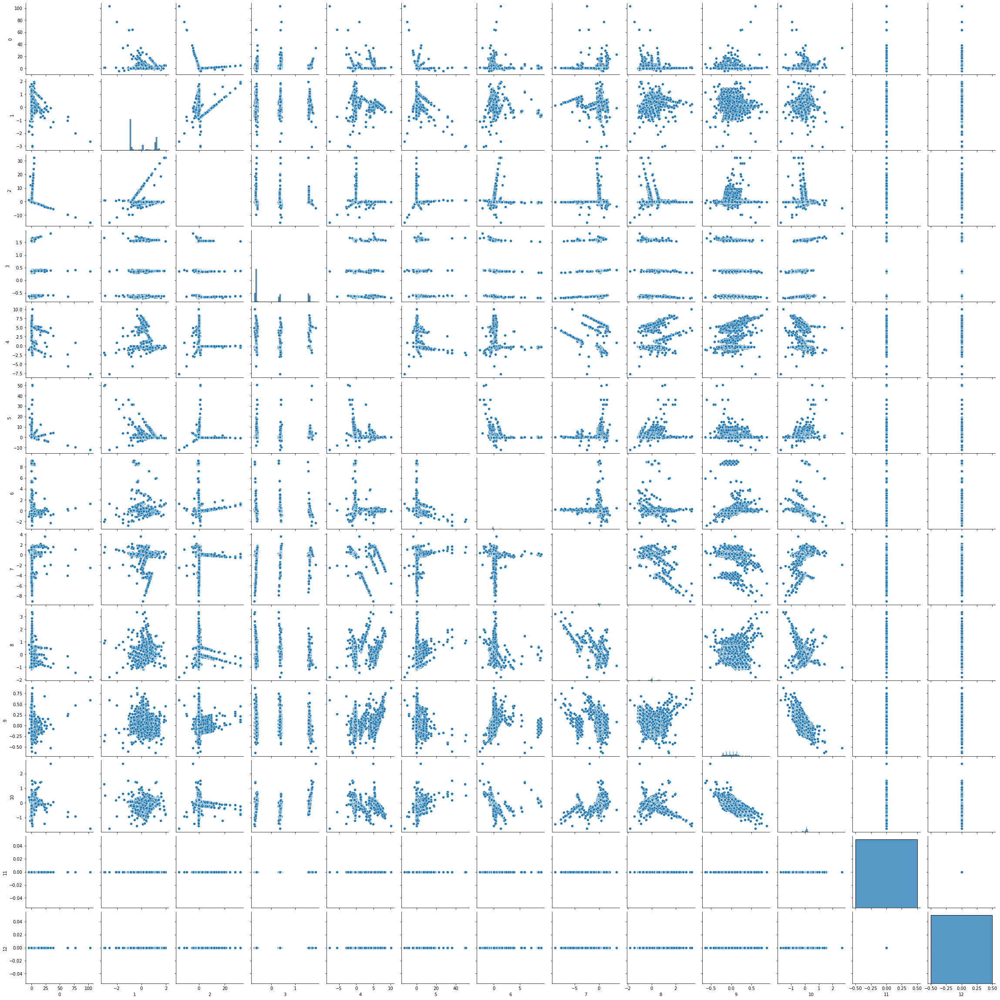

In [38]:
sns.pairplot(df1)

In [82]:
ev, v = fa.get_eigenvalues()

In [83]:
ev, v

(array([3.20282753e+00, 2.32142452e+00, 1.64466012e+00, 1.30658934e+00,
        1.03928389e+00, 9.99817513e-01, 9.51835542e-01, 6.79088525e-01,
        3.52041912e-01, 3.25841861e-01, 1.72440974e-01, 4.14551226e-03,
        2.75411131e-06]),
 array([ 3.18369326e+00,  2.20247995e+00,  1.33047256e+00,  1.07223918e+00,
         9.51755753e-01,  6.66657877e-01,  2.06525077e-01,  5.95057895e-02,
         3.48077910e-02,  1.52928967e-02,  9.34674321e-03, -6.08634446e-04,
        -3.15832117e-03]))

In [86]:
sum(v)

9.729009914094775

In [25]:
explained_variance_score(ev, v)

0.9417742081760979

In [26]:
xvals = range(1, df.shape[1]+1)
#ev

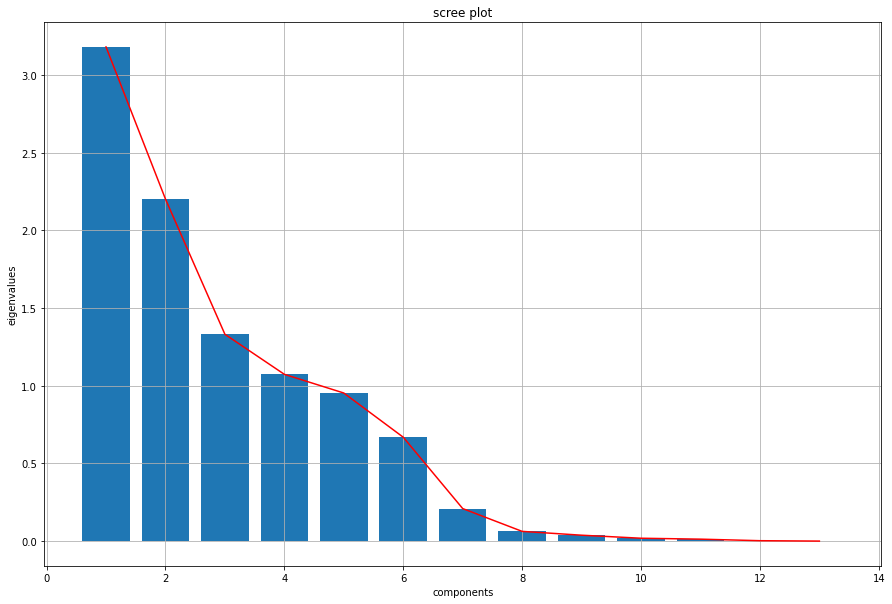

In [27]:
plt.figure(figsize = (15,10))
#for index, value in enumerate(ev):
#    plt.text(index, value, str(round(value, 2)), va = 'bottom', ha = 'center', fontsize = 15)
plt.bar(xvals, v)
plt.plot(xvals, v, c = 'red')
plt.xlabel('components')
plt.ylabel('eigenvalues')
plt.title('scree plot')
plt.grid()
plt.show()

In [28]:
pca = PCA(n_components=13)
np.set_printoptions(threshold = np.inf)
pc = pca.fit_transform(df[:50000])

In [41]:
pc

array([[ 5.47458767e+00, -8.85010344e-01,  5.27365319e-01,
        -8.27951285e-02, -2.43956748e-01,  7.14442510e-01,
         1.82238692e-01, -3.80613754e-01,  4.33226592e-02,
         1.07490901e-02, -1.37125244e-01,  1.12402307e-03,
        -2.63494568e-04],
       [ 5.47471525e+00, -9.51704030e-01,  4.08897591e-01,
        -6.96303931e-02, -2.40056452e-01,  7.10458400e-01,
         2.17839704e-01, -4.99001095e-01,  4.57100223e-02,
         1.17440087e-02, -1.43987206e-01,  2.00810325e-03,
        -1.06997052e-04],
       [ 5.47507773e+00, -9.48373350e-01,  4.15203277e-01,
        -5.66423587e-02, -2.70483463e-01,  6.33816733e-03,
         1.63822380e-01, -4.99136588e-01,  4.69897904e-02,
         1.47968063e-02, -1.45781577e-01,  2.15783827e-03,
        -1.06280774e-04],
       [ 5.47507773e+00, -9.48373350e-01,  4.15203277e-01,
        -5.66423587e-02, -2.70483463e-01,  6.33816733e-03,
         1.63822380e-01, -4.99136588e-01,  4.69897904e-02,
         1.47968063e-02, -1.45781577e

In [42]:
pc = pd.DataFrame(pc)

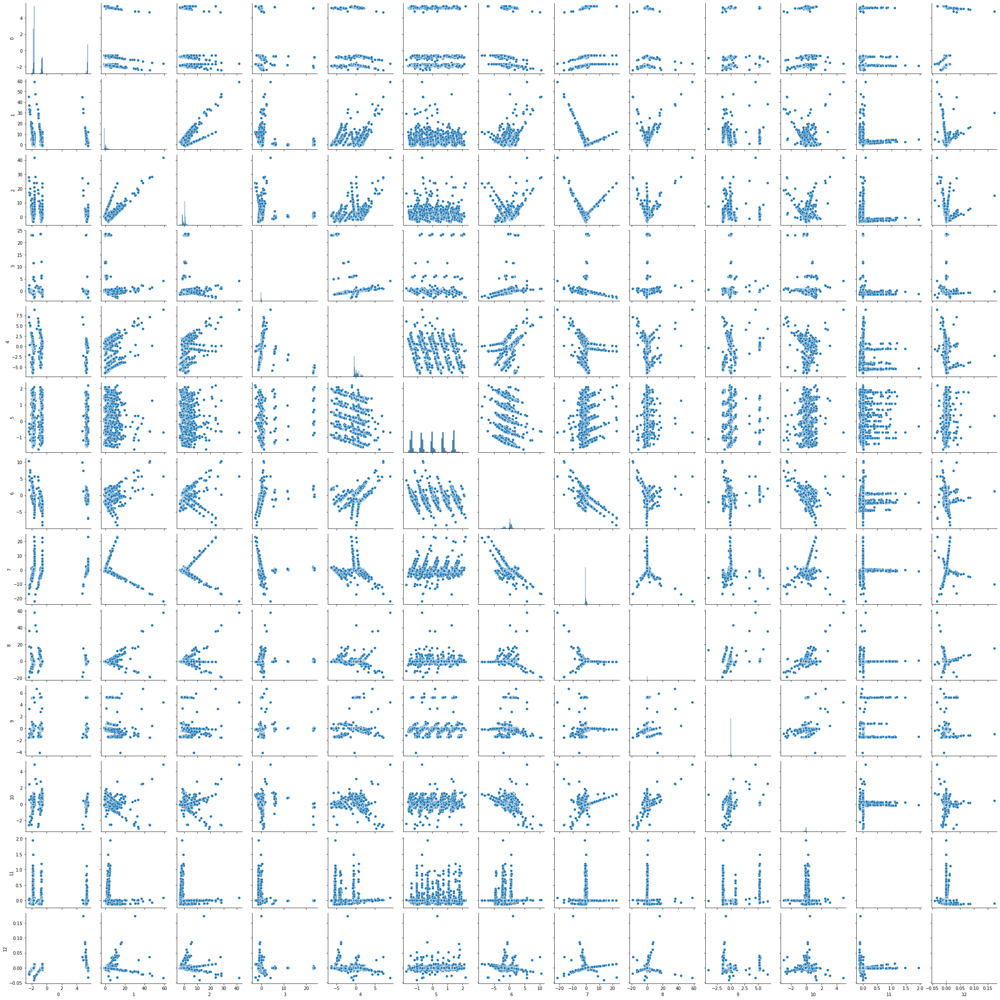

In [43]:
sns.pairplot(pc)

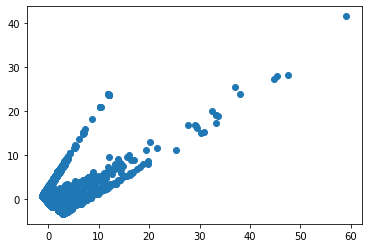

In [29]:
plt.scatter(pc[:50000, 1], pc[:50000, 2])

In [46]:
EVR = pca.explained_variance_ratio_
EVR

array([4.35839780e-01, 1.35960753e-01, 1.08201270e-01, 6.50962053e-02,
       5.98192067e-02, 5.38727747e-02, 5.26861825e-02, 4.25820038e-02,
       2.22607151e-02, 1.45720280e-02, 9.02115408e-03, 8.77848005e-05,
       1.41280957e-07])

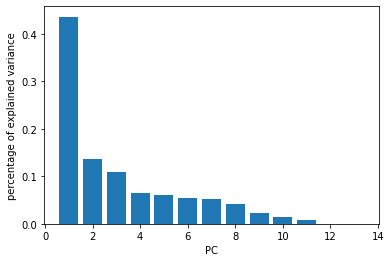

In [45]:
plt.bar(x=range(1,len(EVR)+1), height=EVR)
plt.ylabel('percentage of explained variance')
plt.xlabel('PC')
plt.show()

In [ ]:
#KernalPCA
from sklearn.decomposition import KernelPCA
transformer = KernelPCA(n_components=13, kernel='poly')
Kernal_PCA = transformer.fit_transform(df[:50000])

In [ ]:
Kernal_PCA

In [ ]:
Kernel_PC = pd.DataFrame(Kernal_PCA)
Kernel_PC 

In [2]:
Kernel_PC = pd.read_csv('D:/Study matertrial/Masters project/K_PC13.csv')

In [3]:
Kernel_PC.iloc[:,0]

0       -1.064895
1       -1.065542
2       -1.065504
3       -1.065504
4       -1.065557
           ...   
49995   -1.062400
49996   -1.061802
49997   -1.061543
49998   -1.062291
49999   -1.062371
Name: 0, Length: 50000, dtype: float64

In [4]:
Kernel_PC.columns.shape

(13,)

In [5]:
def variance(data):
     n = len(data)
     mean = sum(data) / n
     deviations = [(x - mean) ** 2 for x in data]
     variance = sum(deviations) / n
     return variance

lst_ker = []
for i in range(Kernel_PC.columns.shape[0]):
    lst_ker.append(variance(Kernel_PC.iloc[:,i]))
        
lst_ker
#variance(Kernel_PC.iloc[:,0])

[9239.53574999352,
 1180.0761062475242,
 215.96599998531568,
 189.69250613224327,
 76.67518230716054,
 16.26459877874536,
 13.411362706062075,
 13.131336761445793,
 8.800091002314376,
 5.98420522693127,
 4.079268955972392,
 3.796267795949191,
 2.8713269441150837]

In [6]:
sum_ker_v = sum(lst_ker)
lst_Ker_var_ratio = []
for i in lst_ker:
    lst_Ker_var_ratio.append(i/sum_ker_v)

lst_Ker_var_ratio

[0.8422330495367167,
 0.10757024211427116,
 0.019686454783619026,
 0.01729148544223487,
 0.006989352535205984,
 0.0014826050788237352,
 0.001222517366240785,
 0.0011969915052381112,
 0.0008021753128759806,
 0.0005454922794508824,
 0.0003718471604670717,
 0.0003460500926837758,
 0.0002617367921716938]

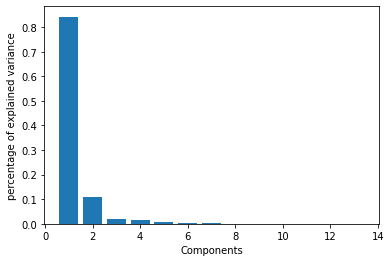

In [10]:
plt.bar(x=range(1,len(lst_Ker_var_ratio)+1), height=lst_Ker_var_ratio)
plt.ylabel('percentage of explained variance')
plt.xlabel('Components')
plt.show()

In [12]:
sum(lst_Ker_var_ratio)

0.9999999999999998

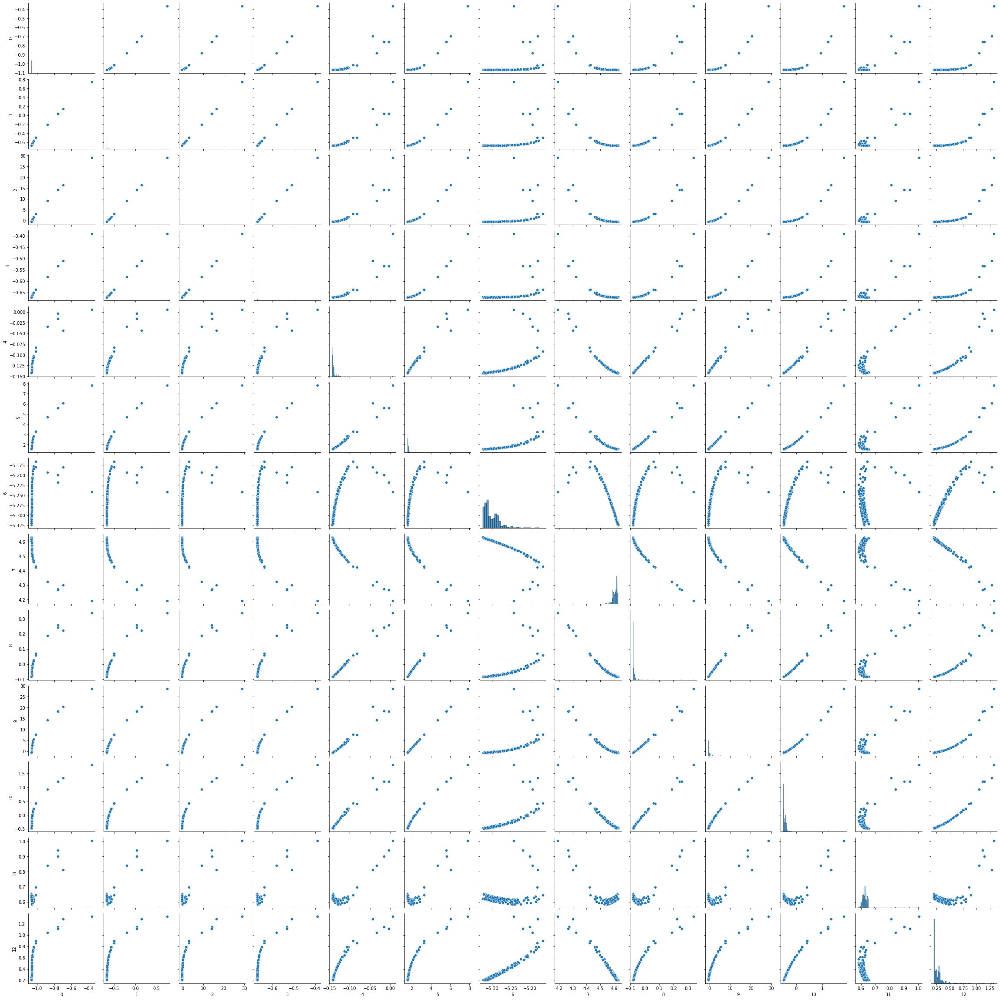

In [8]:
sns.pairplot(Kernel_PC)

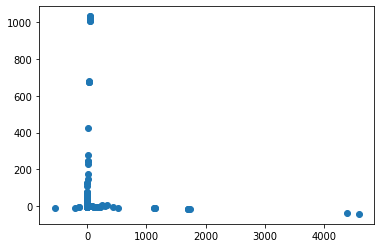

In [12]:
plt.scatter(Kernel_PC.iloc[:, 1], Kernel_PC.iloc[:, 2])

In [ ]:
from sklearn.manifold import locally_linear_embedding
lle= manifold.LocallyLinearEmbedding(n_components=13,method='standard',eigen_solver='dense')
LLE_1=lle.fit_transform(df[:50000])

In [ ]:
LLE_1

In [ ]:
LLE1 = pd.DataFrame(LLE_1)
LLE1

In [3]:
LLE1 = pd.read_csv('D:/Study matertrial/Masters project/LLE1_13.csv')

In [4]:
def variance(data):
     n = len(data)
     mean = sum(data) / n
     deviations = [(x - mean) ** 2 for x in data]
     variance = sum(deviations) / n
     return variance

lst_LLE1 = []
for i in range(LLE1.columns.shape[0]):
    lst_LLE1.append(variance(LLE1.iloc[:,i]))
        
lst_LLE1
#variance(Kernel_PC.iloc[:,0])

[1.9776991571854016e-05,
 1.9861226757503886e-05,
 1.9838006109171893e-05,
 1.986284999080165e-05,
 1.981774291545533e-05,
 1.999476540216474e-05,
 1.9907212087759404e-05,
 1.9992353901304805e-05,
 1.9862915151161087e-05,
 1.9999932131938235e-05,
 1.992500337639842e-05,
 1.997788117327657e-05,
 1.9944575793352302e-05]

In [5]:
sum_LLE1_v = sum(lst_LLE1)
lst_LLE1_var_ratio = []
for i in lst_LLE1:
    lst_LLE1_var_ratio.append(i/sum_LLE1_v)

lst_LLE1_var_ratio

[0.0764294336950078,
 0.07675496589301795,
 0.0766652282301587,
 0.07676123898067398,
 0.07658691983755093,
 0.07727103442400489,
 0.07693267910773706,
 0.07726171502654192,
 0.07676149079700069,
 0.07729100157771523,
 0.07700143466696578,
 0.07720578425450306,
 0.07707707350912198]

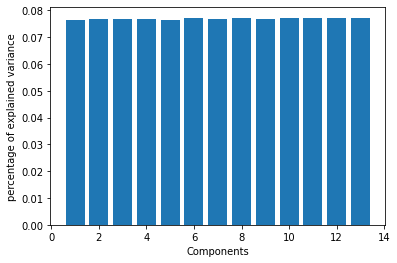

In [6]:
plt.bar(x=range(1,len(lst_LLE1_var_ratio)+1), height=lst_LLE1_var_ratio)
plt.ylabel('percentage of explained variance')
plt.xlabel('Components')
plt.show()

In [7]:
sum(lst_LLE1_var_ratio[:-1])

0.9229229264908779

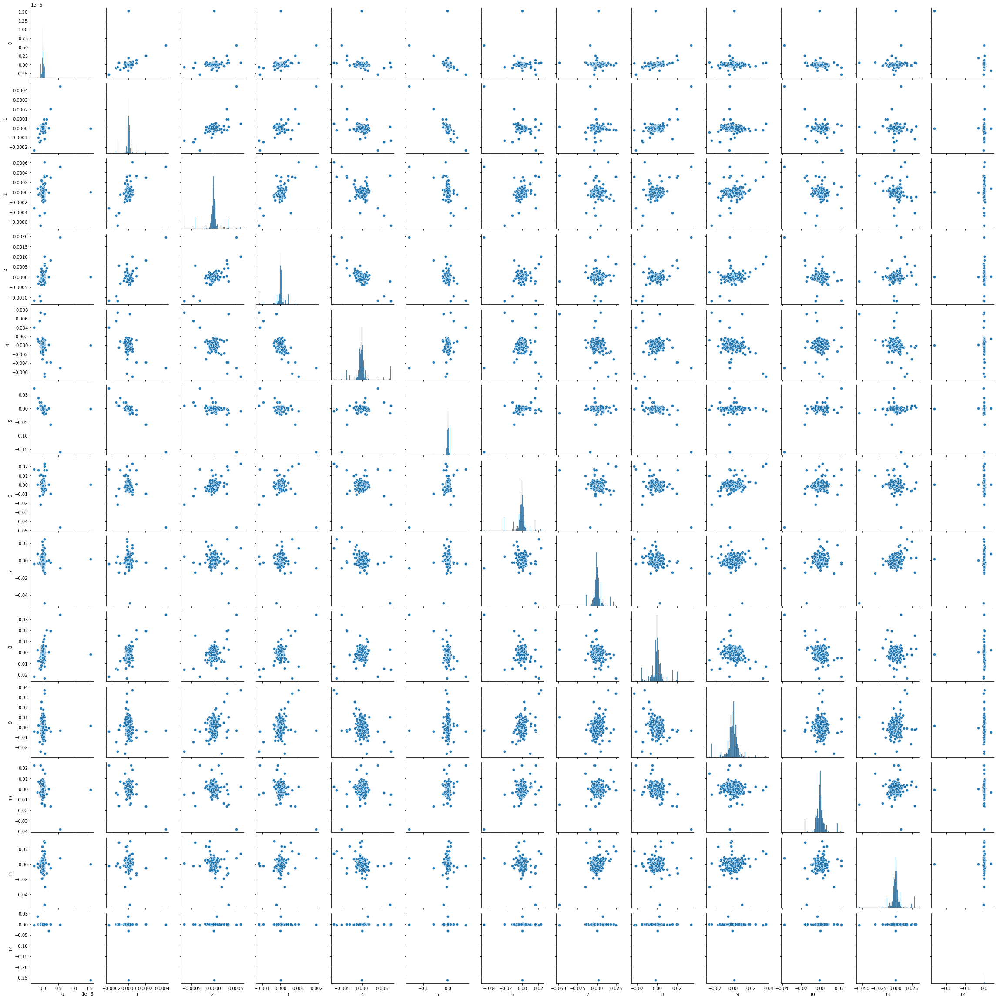

In [8]:
sns.pairplot(LLE1)

In [ ]:
plt.scatter(LLE_1[:50000, 0], LLE_1[:50000, 1])

In [ ]:
from sklearn.manifold import locally_linear_embedding
lle2= manifold.LocallyLinearEmbedding(n_components=13, n_neighbors=200, method='hessian', eigen_solver='dense')
LLE_2=lle2.fit_transform(df[:50000])

In [ ]:
LLE_2

In [ ]:
LLE2 = pd.DataFrame(LLE_2)
LLE2

In [9]:
LLE2 = pd.read_csv('D:/Study matertrial/Masters project/LLE2_13.csv')

In [10]:
def variance(data):
     n = len(data)
     mean = sum(data) / n
     deviations = [(x - mean) ** 2 for x in data]
     variance = sum(deviations) / n
     return variance

lst_LLE2 = []
for i in range(LLE2.columns.shape[0]):
    lst_LLE2.append(variance(LLE2.iloc[:,i]))
        
lst_LLE2
#variance(Kernel_PC.iloc[:,0])

[1.9997116123253552e-05,
 1.9994228914455495e-05,
 1.9897605731621182e-05,
 1.9999898099955894e-05,
 1.99795866862065e-05,
 1.999595346001173e-05,
 1.9999693360385965e-05,
 1.9994712003880075e-05,
 1.996417715415354e-05,
 1.9917209977556277e-05,
 1.9883169752780794e-05,
 1.9947450027637538e-05,
 1.989869861762949e-05]

In [11]:
sum_LLE2_v = sum(lst_LLE2)
lst_LLE2_var_ratio = []
for i in lst_LLE2:
    lst_LLE2_var_ratio.append(i/sum_LLE2_v)

lst_LLE2_var_ratio

[0.0770692359997077,
 0.07705810864640004,
 0.07668572120638106,
 0.07707995778667423,
 0.07700167724211514,
 0.0770647550751974,
 0.07707916871678355,
 0.07705997048150878,
 0.07694228863552233,
 0.07676127631379033,
 0.07663008469093158,
 0.07687782199677737,
 0.07668993320821052]

In [59]:
sum(lst_LLE2_var_ratio)

1.0000000000000002

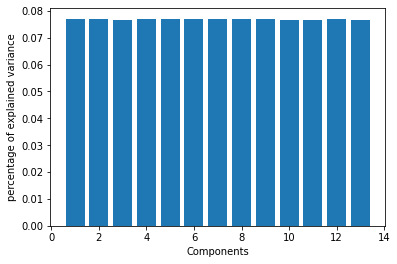

In [13]:
plt.bar(x=range(1,len(lst_LLE2_var_ratio)+1), height=lst_LLE2_var_ratio)
plt.ylabel('percentage of explained variance')
plt.xlabel('Components')
plt.show()

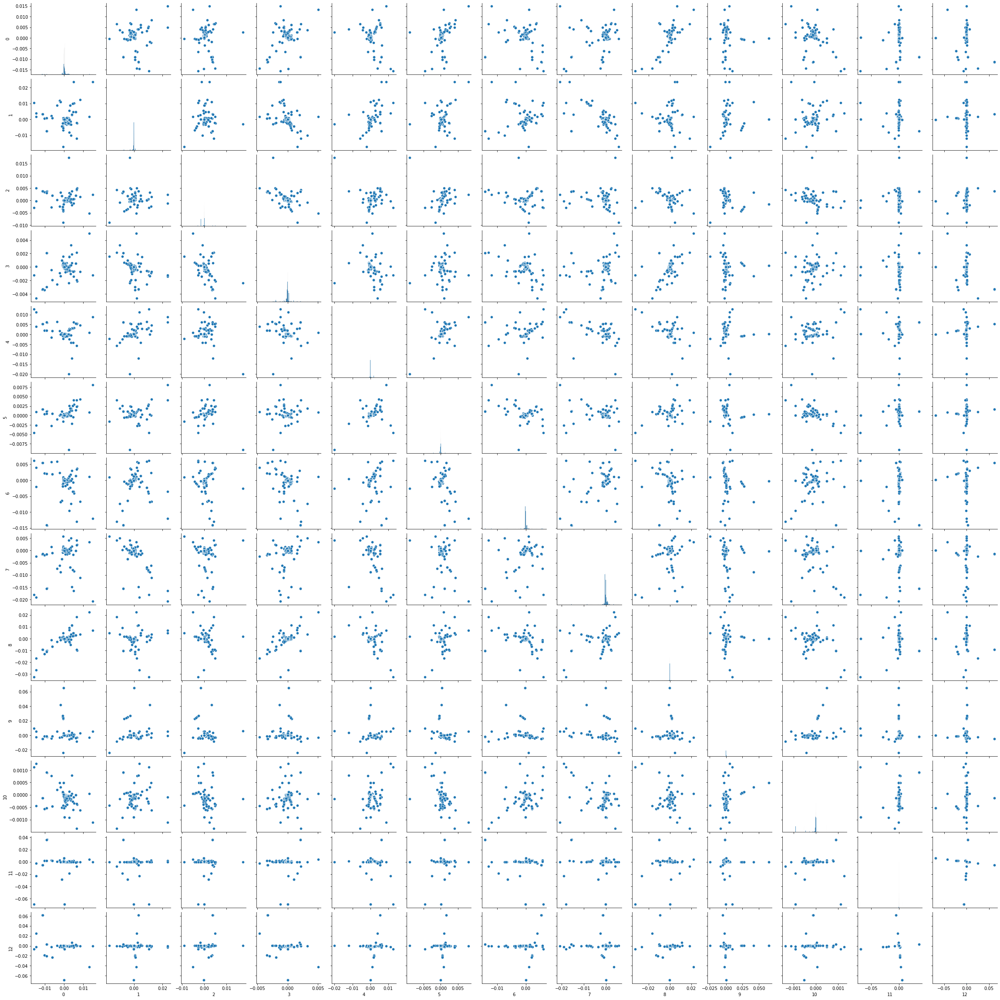

In [14]:
sns.pairplot(LLE2)

In [ ]:
plt.scatter(LLE_2[:50000, 0], LLE_2[:50000, 1])

In [ ]:
from sklearn.manifold import locally_linear_embedding
lle3= manifold.LocallyLinearEmbedding(n_components=5,method='ltsa',eigen_solver='dense')
LLE_3=lle3.fit_transform(df[:50000])

In [ ]:
LLE_3

In [ ]:
LLE3 = pd.DataFrame(LLE_3)
LLE3

In [16]:
LLE3 = pd.read_csv('D:/Study matertrial/Masters project/LLE3.csv')

In [17]:
def variance(data):
     n = len(data)
     mean = sum(data) / n
     deviations = [(x - mean) ** 2 for x in data]
     variance = sum(deviations) / n
     return variance

lst_LLE3 = []
for i in range(LLE3.columns.shape[0]):
    lst_LLE3.append(variance(LLE3.iloc[:,i]))
        
lst_LLE3
#variance(Kernel_PC.iloc[:,0])

[1.9997999955235004e-05,
 1.9997999955245666e-05,
 1.999799995524654e-05,
 1.9997999955247194e-05,
 1.999799995524569e-05]

In [18]:
sum_LLE3_v = sum(lst_LLE3)
lst_LLE3_var_ratio = []
for i in lst_LLE3:
    lst_LLE3_var_ratio.append(i/sum_LLE3_v)

lst_LLE3_var_ratio

[0.19999999999990986,
 0.2000000000000165,
 0.20000000000002524,
 0.20000000000003176,
 0.20000000000001672]

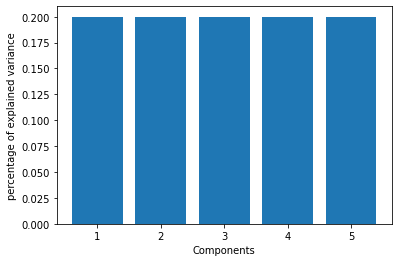

In [19]:
plt.bar(x=range(1,len(lst_LLE3_var_ratio)+1), height=lst_LLE3_var_ratio)
plt.ylabel('percentage of explained variance')
plt.xlabel('Components')
plt.show()

In [101]:
sum(lst_LLE3_var_ratio)

1.0